In [ ]:
%pip install segment-geospatial leafmap localtileserver

In [2]:
import os
import leafmap
from samgeo import SamGeo, show_image, download_file, overlay_images, tms_to_geotiff

In [3]:
m = leafmap.Map(center=[37.8713, -122.2580], zoom=17, height="800px")
m.add_basemap("SATELLITE") # google satellite basemap without label, berkeley campus
m

Map(center=[37.8713, -122.258], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'z…

In [4]:
if m.user_roi_bounds() is not None:
    bbox = m.user_roi_bounds()
else:
    bbox = [-122.2659, 37.8682, -122.2521, 37.8741]

In [6]:
#if you draw a rectangle on the map above, it can be printed here
m.user_roi_bounds()


[-122.267, 37.868, -122.2513, 37.8752]

In [7]:
# using the bbox, can download the imagery using tms_to_geotiff
# source is the basemap, the larger the zoom the larger the file size
image="satellite.tif"
tms_to_geotiff(bbox=bbox, output=image,zoom=17,source="Satellite",overwrite=True)

Downloaded image 01/35
Downloaded image 02/35
Downloaded image 03/35
Downloaded image 04/35
Downloaded image 05/35
Downloaded image 06/35
Downloaded image 07/35
Downloaded image 08/35
Downloaded image 09/35
Downloaded image 10/35
Downloaded image 11/35
Downloaded image 12/35
Downloaded image 13/35
Downloaded image 14/35
Downloaded image 15/35
Downloaded image 16/35
Downloaded image 17/35
Downloaded image 18/35
Downloaded image 19/35
Downloaded image 20/35
Downloaded image 21/35
Downloaded image 22/35
Downloaded image 23/35
Downloaded image 24/35
Downloaded image 25/35
Downloaded image 26/35
Downloaded image 27/35
Downloaded image 28/35
Downloaded image 29/35
Downloaded image 30/35
Downloaded image 31/35
Downloaded image 32/35
Downloaded image 33/35
Downloaded image 34/35
Downloaded image 35/35
Saving GeoTIFF. Please wait...
Image saved to satellite.tif


In [15]:
m.layers[-1].visible=False # hide the satellite basemap layer
m.add_raster(image, layer_name="Image") # the image is what we just downloaded, we put it on top
m

Map(bottom=3240106.0, center=[37.86529991641881, -122.26356267929079], controls=(ZoomControl(options=['positio…

In [16]:
# once we have the above, can start to do segmentation
# need to download the checkpoint first, which is the model
# out_dir=os.path.join(os.path.expanduser("~"), "Downloads")
# checkpoint=os.path.join(out_dir,"sam_vit_h_4b8939.pth")
os.chdir('/content')
checkpoint="sam_vit_h_4b8939.pth"

In [18]:
# there are multiple checkpoints, we use default sam params
sam = SamGeo(
    model_type="vit_h",
    checkpoint=checkpoint,
    sam_kwargs=None,
)

In [19]:
# image: the image we want to do segmentation
# unique: instead of 0 and 1 binary, we will have 2,3,4...for all objects
# masks.tif is the segmentation result
sam.generate(image, output="masks.tif", foreground=True, unique=True)

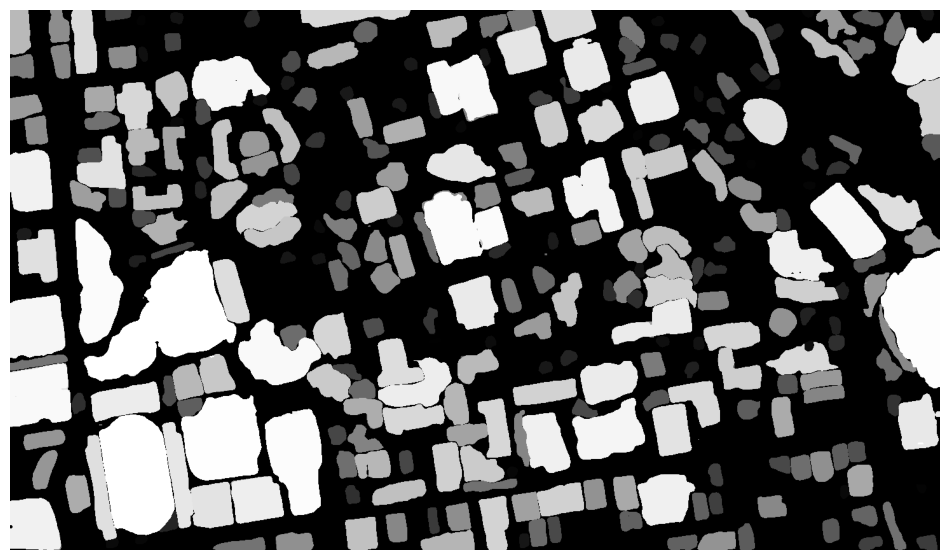

In [20]:
# since we set unique=True, each object gets unique identifier,
# the larger the area, the brighter the color
sam.show_masks(cmap="binary_r")

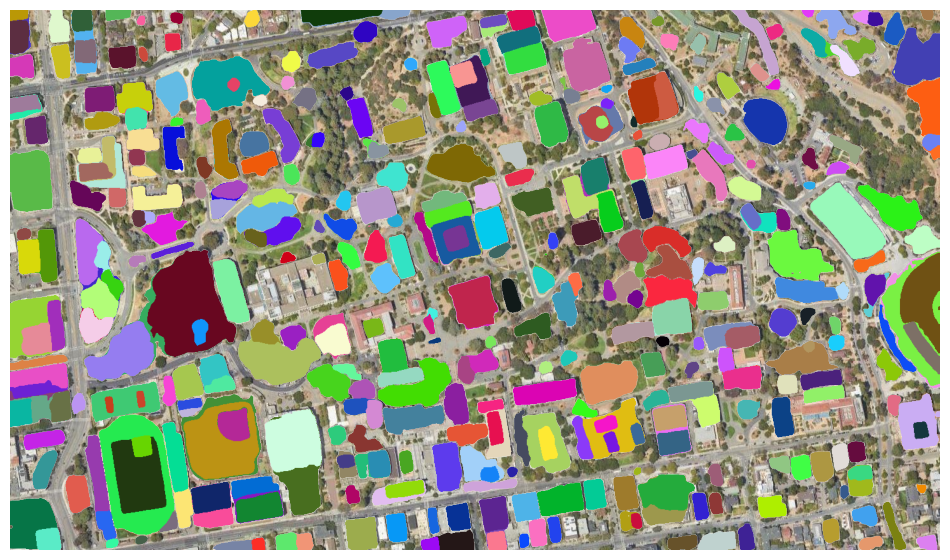

In [21]:
# show the object annotations(objects with random color)
# alpha: opacity
sam.show_anns(axis="off", alpha=1, output="annotations.tif")


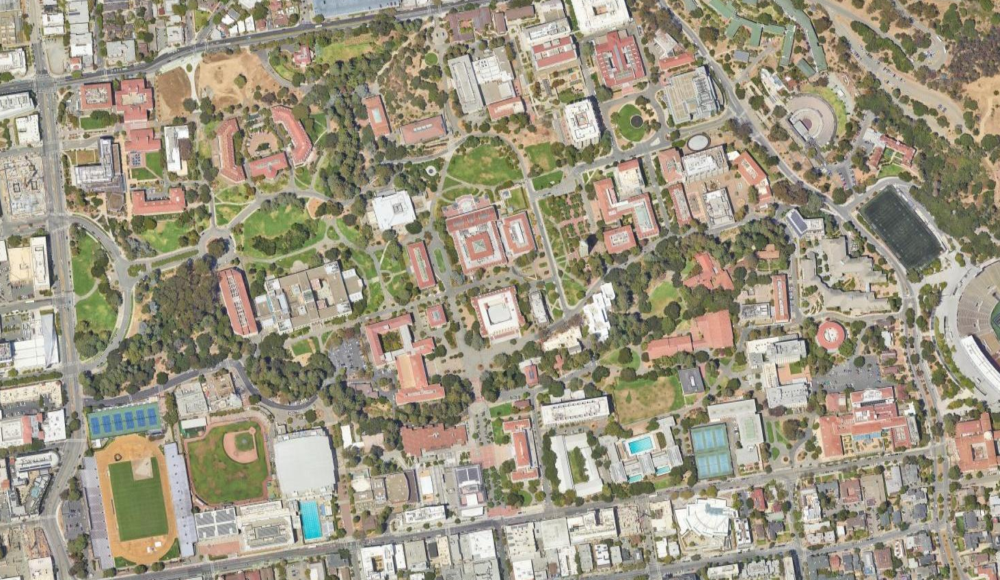
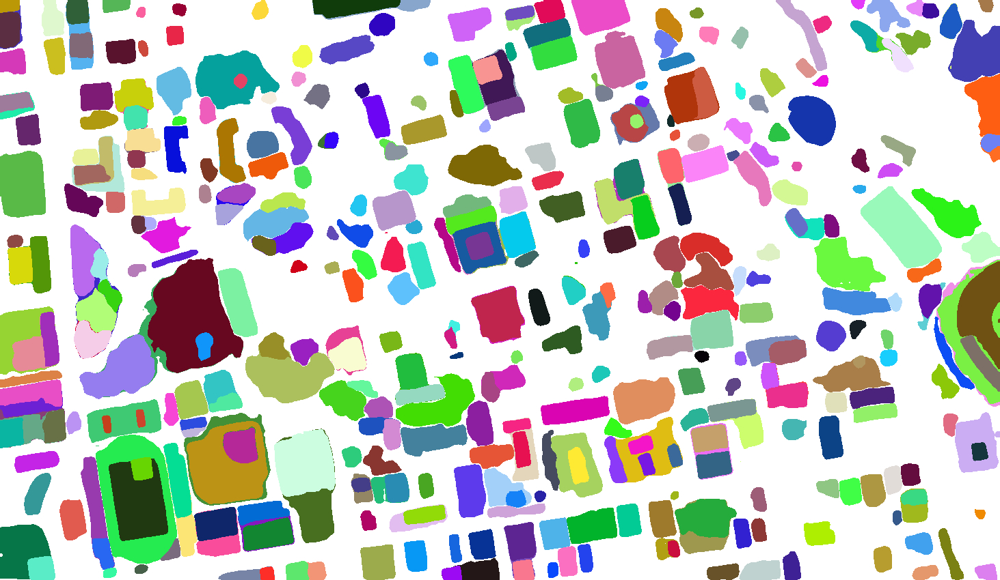

In [22]:
# compare segmentation result; satellite.tif is the original image
# annotations means object with different colors
# .tif allows you to overlay on top
leafmap.image_comparison(
    "satellite.tif",
    "annotations.tif",
    label1="Satellite Image",
    label2="Image Segmentation",
)

In [23]:
# add annotation on top of the imagery
m.add_raster("annotations.tif", alpha=0.5, layer_name="Masks")
m

Map(bottom=3239920.0, center=[37.87160128507345, -122.25914239883424], controls=(ZoomControl(options=['positio…

In [24]:
# can convert the mask(which is basically the unique identifer with different colors) to vector data
# sam.tiff_to_vector("masks.tif", "masks.geojson")
sam.tiff_to_vector("masks.tif", "masks.gpkg")

In [25]:
# same model, but more tunable params
sam_kwargs = {
    "points_per_side": 32,
    "pred_iou_thresh": 0.86,
    "stability_score_thresh": 0.92,
    "crop_n_layers": 1,
    "crop_n_points_downscale_factor": 2,
    "min_mask_region_area": 100,
}

In [26]:
sam = SamGeo(
    model_type="vit_h",
    checkpoint=checkpoint,
    sam_kwargs=sam_kwargs,
)

In [27]:
sam.generate(image, output="masks2.tif", foreground=True)

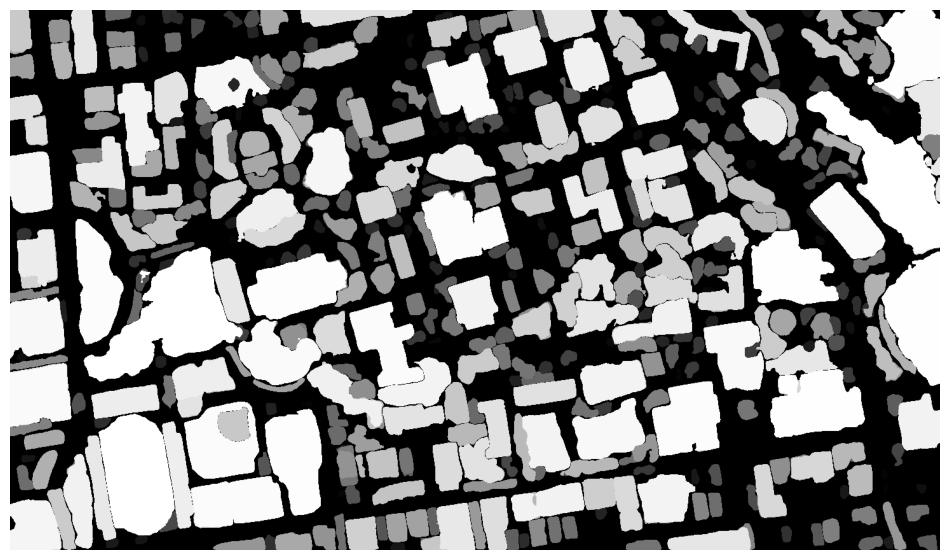

In [28]:
# now we have more objects compared to the previous one
sam.show_masks(cmap="binary_r")

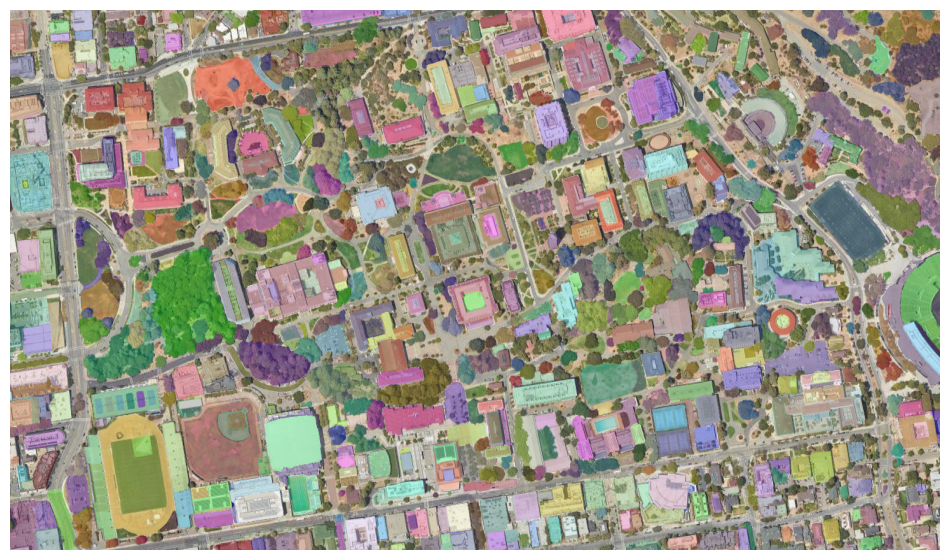

In [29]:
sam.show_anns(axis="off", opacity=1, output="annotations2.tif")


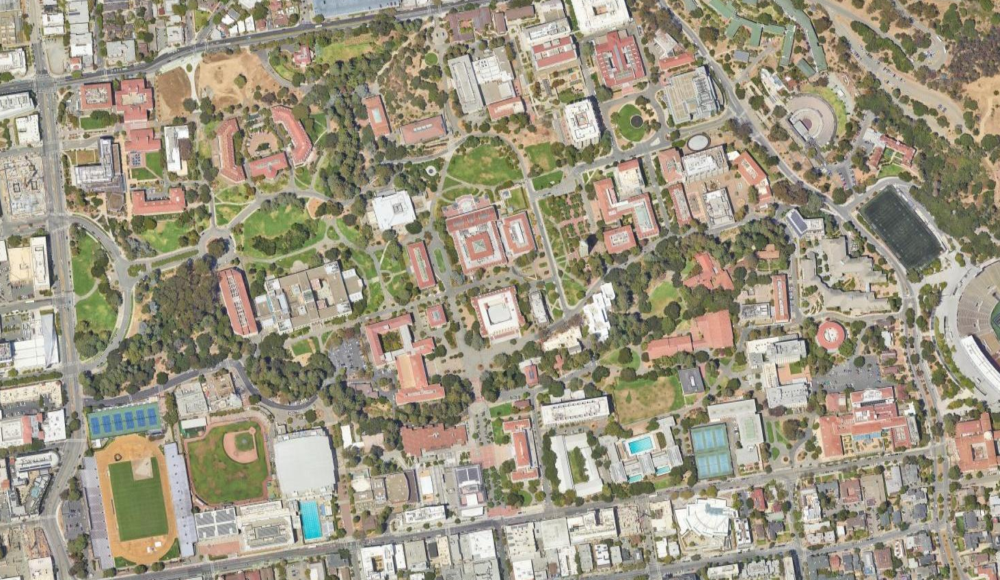
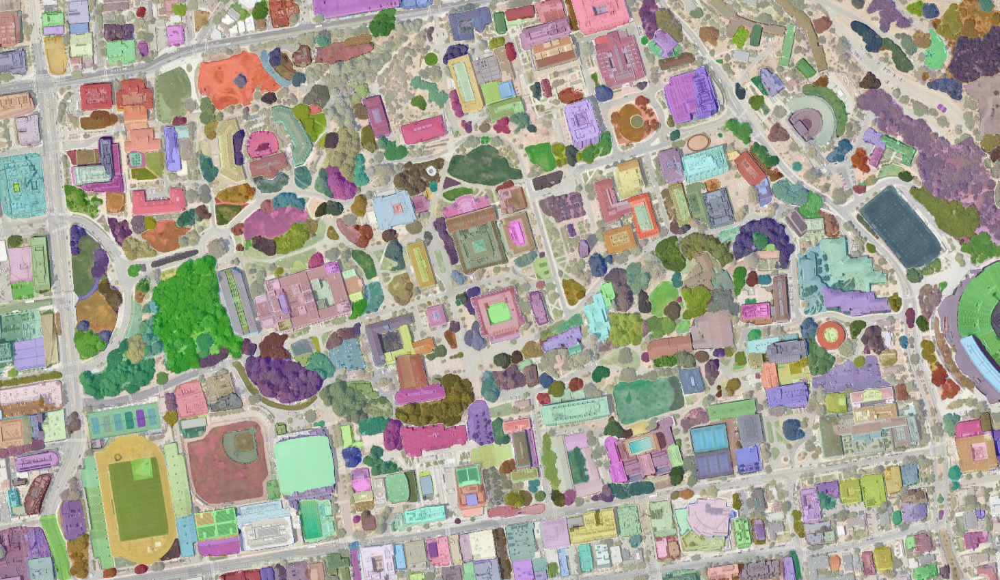

In [30]:
# this time is annotations2
leafmap.image_comparison(
    image,
    "annotations2.tif",
    label1="Image",
    label2="Image Segmentation",
)

In [31]:
overlay_images(image, "annotations2.tif", backend="TkAgg")

The TkAgg backend is not supported in Google Colab. The overlay_images function will not work on Colab.
